# Advanced Lane Finding

## Overview

The aim of the project is to develop a software pipeline to identify the lane boundaries in a video from a front-facing camera on a car. 

In [1]:
import numpy as np

import glob
import cv2
import PIL

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec

%matplotlib inline

## Camera Calibration

Detected corners:


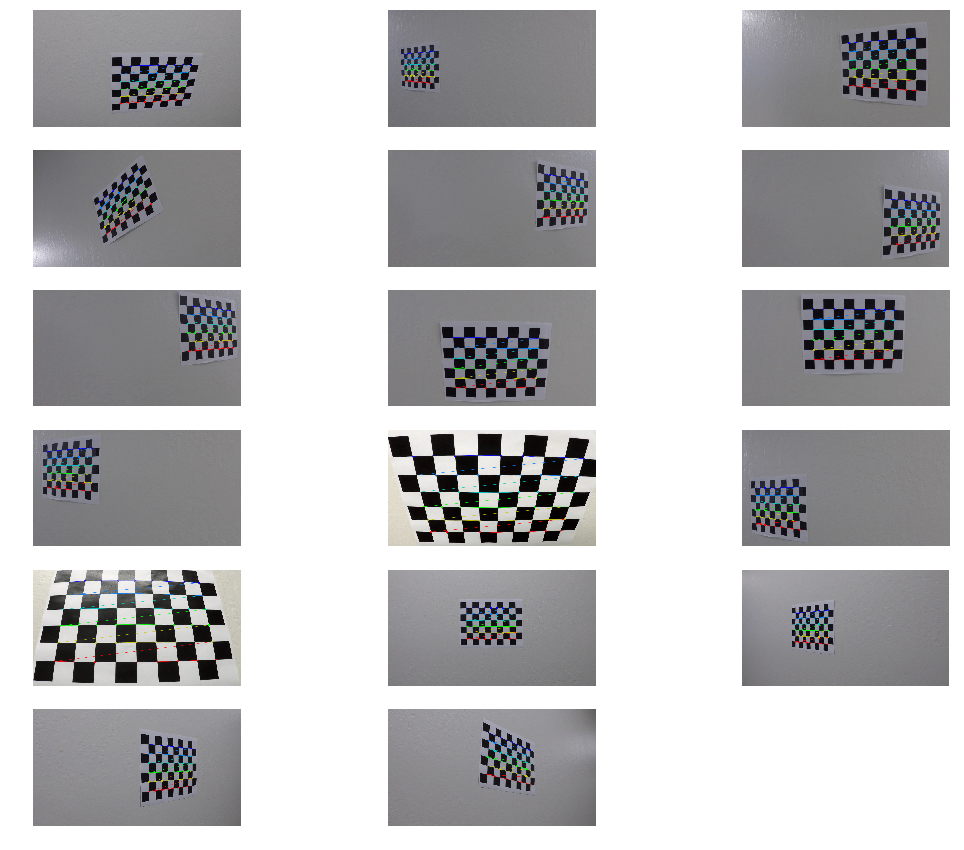

In [2]:


# Calibrates the camera, and returns the mtx and dist
def calibrate(images):

    # prepare object points
    nx = 9 # The number of inside corners in x
    ny = 6 # The number of inside corners in y
    
    image_points = []   
    pattern_points = [] 
    calibrated_images = []
    mtx = None
    dist = None

    image_size = None

    pattern = np.zeros((ny * nx, 3), np.float32)
    
    pattern[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
    

    # Looking for chessboard corners
    for i, path, in enumerate(images):
        image = mpimg.imread(path)
        # convert to grayscale
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        # find the chessboard corners
        found, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        # when corners found add object and image points
        if found:
            image_points.append(corners)
            image_size = (image.shape[1], image.shape[0])
            
            pattern_points.append(pattern)            
            
            cv2.drawChessboardCorners(image, (nx, ny), corners, True)

            calibrated_images.append(image)

    # if points were found, then calibrate the camera 
    if pattern_points and image_points:
        _, mtx, dist, _, _ = cv2.calibrateCamera(pattern_points, image_points,image_size, None, None)
        
    return mtx, dist, calibrated_images


mtx, dist, calibrated_images = calibrate(glob.glob('camera_cal/calibration*.jpg'))

plt.figure(figsize=(18, 15))
gridspec.GridSpec(6, 3)

print('Detected corners:')

# Loop through the images and look for the chessboard corners
for i, image, in enumerate(calibrated_images):
    plt.subplot2grid((6, 3), (i//3, i%3), colspan=1, rowspan=1)
    plt.imshow(image)
    plt.axis('off')
plt.show()

## Remove Distortion From a Test Image

Text(0.5,1,'Undistorted Image')

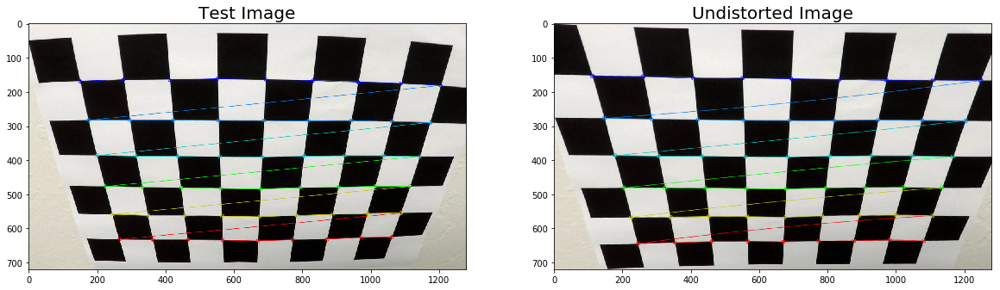

In [3]:

def undistort(image):

    if mtx is not None and dist is not None:
        return cv2.undistort(image, mtx, dist, None, mtx)
    else:
        return image
        
test_image = calibrated_images[10]

test_undistorted = undistort(test_image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(test_image)
ax1.set_title('Test Image', fontsize=20)

ax2.imshow(test_undistorted)
ax2.set_title('Undistorted Image', fontsize=20)

## Edge Detection

In [4]:
def detect_edges(image, sobel_ksize = 3, magnit_threshold = (20, 100), direct_threshold = (0.7, 1.3)):
    
    
    # Convert to HLS space
    hls = cv2.cvtColor(np.copy(image), cv2.COLOR_RGB2HLS).astype(np.float)
    
    # Obtain the S channel from the color space
    s = hls[:, :, 2]
    
    # Get all gradients
    
    grad_x = np.absolute(cv2.Sobel(s, cv2.CV_64F, 1, 0, ksize=sobel_ksize))   
    grad_x  = np.uint8(255*grad_x / np.max(grad_x)) # Scale to 8 bit
    grad_x = mask_image(grad_x, threshold=(20, 100))

    grad_y = np.absolute(cv2.Sobel(s, cv2.CV_64F, 1, 0, ksize=sobel_ksize))   
    grad_y  = np.uint8(255*grad_y / np.max(grad_y)) # Scale to 8 bit
    grad_y = mask_image(grad_y, threshold=(20, 100))
       
    sobel_x = cv2.Sobel(s, cv2.CV_64F, 1, 0, ksize=sobel_ksize)
    sobel_y = cv2.Sobel(s, cv2.CV_64F, 0, 1, ksize=sobel_ksize)
       
    direct = np.arctan2(np.absolute(sobel_y), np.absolute(sobel_x))   
    direct = mask_image(direct, direct_threshold)
    
    magnit = np.sqrt(sobel_x**2 + sobel_y**2)
    magnit = np.uint8(255*magnit / np.max(magnit))  
    magnit = mask_image(magnit, magnit_threshold)
      
    g_mask = np.zeros_like(s)
    g_mask[((grad_x == 1) & (grad_y == 1)) | ((magnit == 1) & (direct == 1))] = 1

    c_mask = mask_image(s, (170, 255))   
   
    edges = np.zeros_like(g_mask)
    
    edges[(g_mask == 1) | (c_mask == 1)] = 1
    
    return edges
    

def mask_image(image, threshold):

    # Scale to 8 bit
    mask = np.zeros_like(image)
    mask[(image >= threshold[0]) & (image <= threshold[1])] = 1
    
    return mask


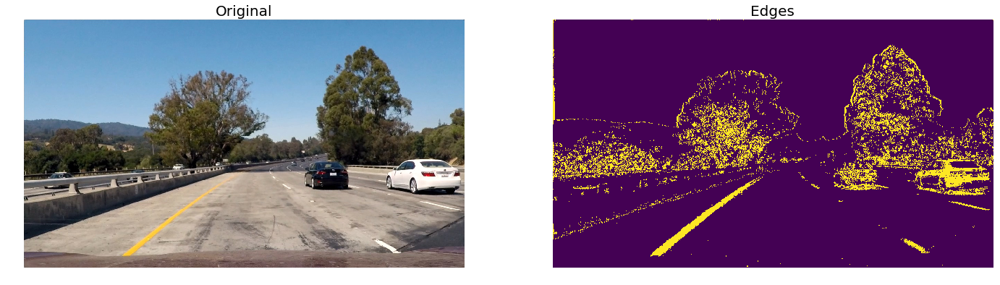

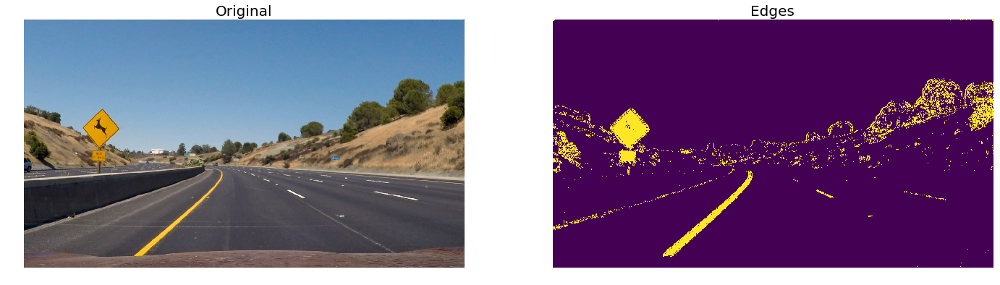

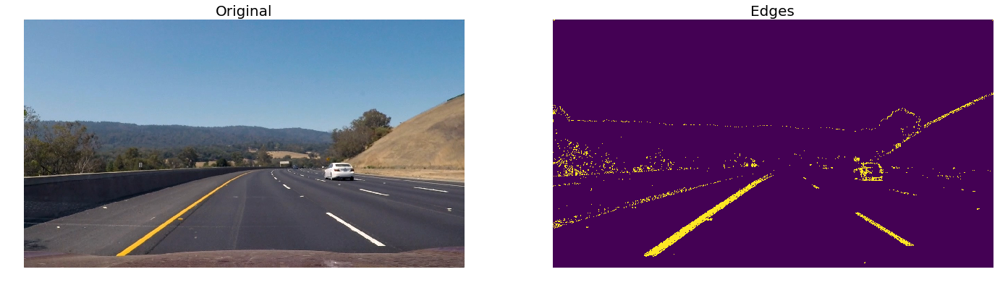

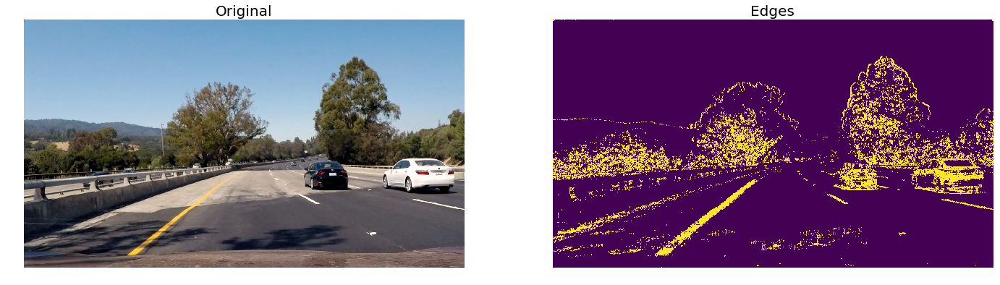

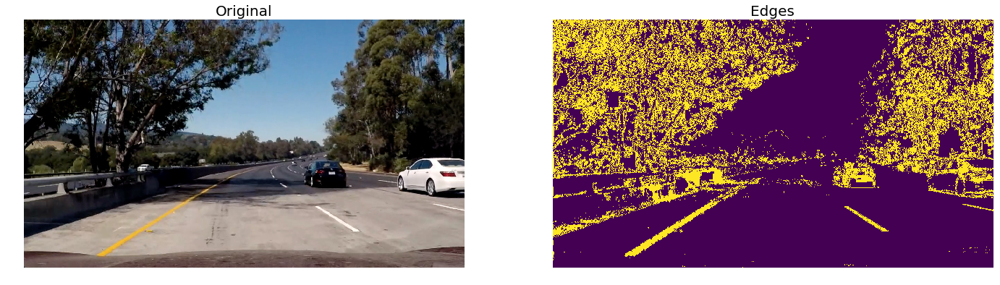

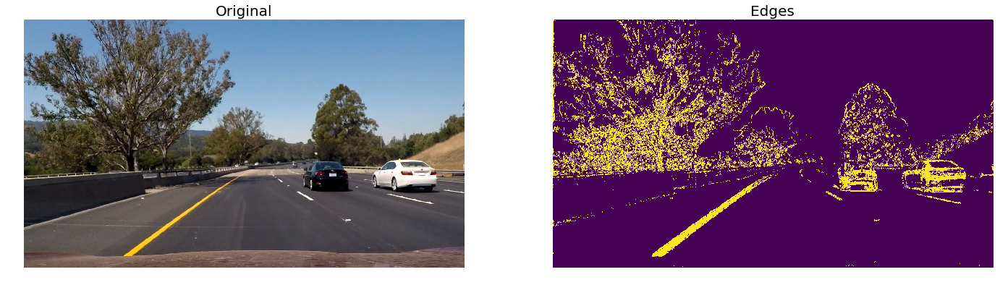

In [5]:
for image in glob.glob('test_images/test*.jpg'):
    image = mpimg.imread(image)
    edges = detect_edges(image)

    f, (x1, x2) = plt.subplots(1, 2, figsize=(24, 9))
    x1.axis('off')
    x1.imshow(image)
    x1.set_title('Original', fontsize=20)

    x2.axis('off')
    x2.imshow(edges)
    x2.set_title('Edges', fontsize=20)



# Transform the Perspective

In [6]:
def transform_perspective(image):
    
    image_size = image.shape    
    
    # Find Quadrangle coordinates in the source image
    
    src = np.float32([[image_size[1] // 2 - 76, image_size[0] * 0.625],
                      [image_size[1] // 2 + 76, image_size[0] * 0.625],
                      [-100, image_size[0]],
                      [image_size[1] + 100, image_size[0]]
                     ])
    
    # Find Quadrangle coordinates in to be transformed image
    
    dst = np.float32([[100, 0],
                      [image_size[1] - 100, 0],
                      [100, image_size[0]],
                      [image_size[1] - 100, image_size[0]]
                     ])
        
    M = cv2.getPerspectiveTransform(src, dst)
   
    warped = cv2.warpPerspective(image, M, (image_size[1], image_size[0]))
    unwarped = cv2.getPerspectiveTransform(dst, src)
    
    return (warped, unwarped)

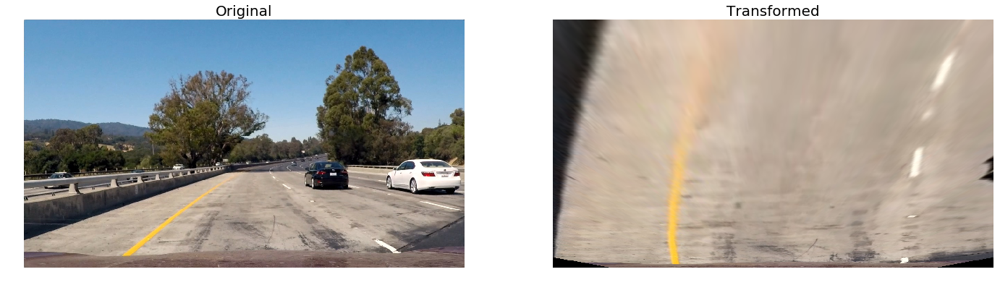

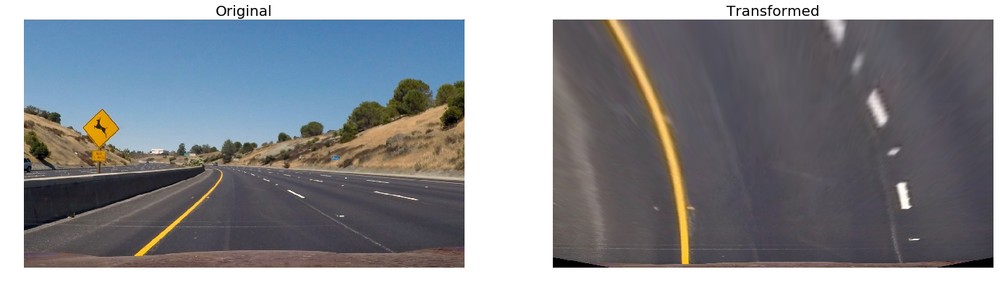

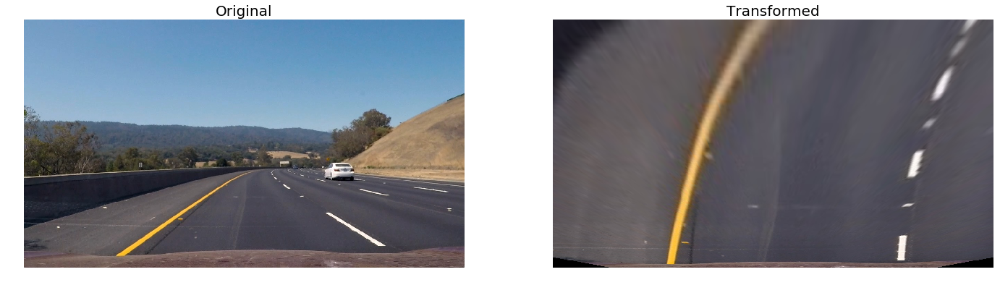

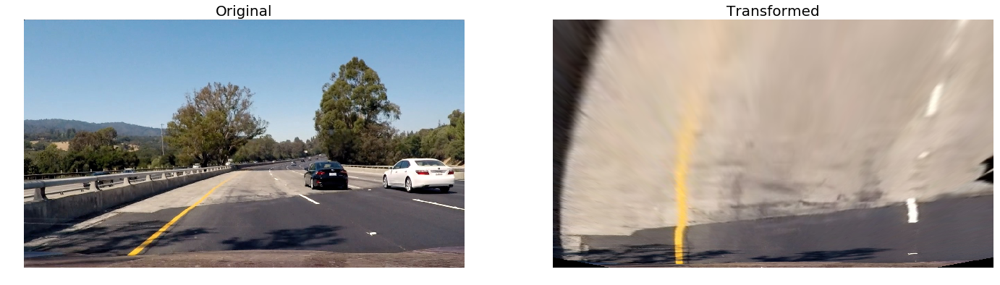

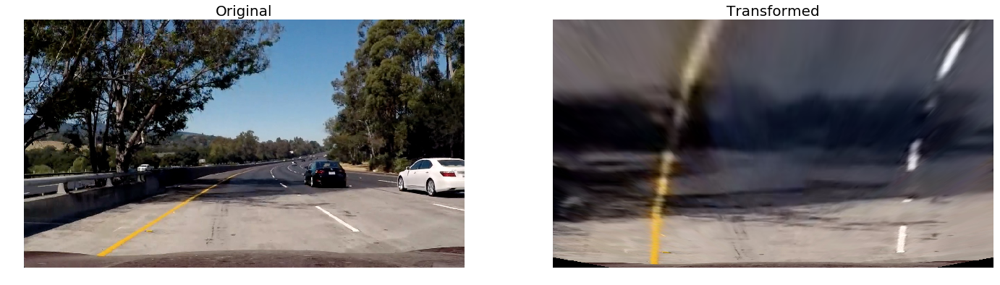

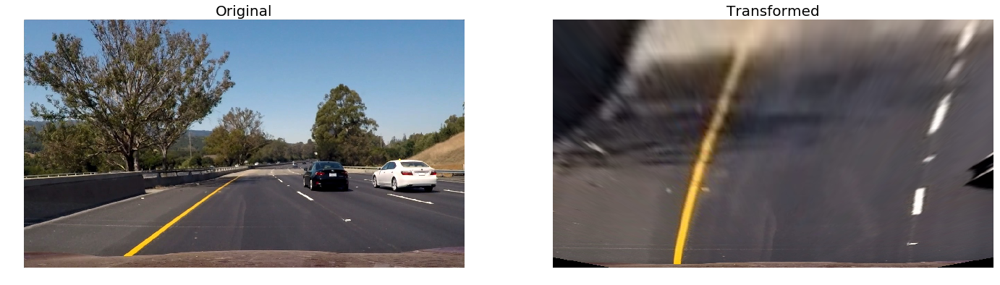

In [7]:
for image in glob.glob('test_images/test*.jpg'):
    image = mpimg.imread(image)
    transformed, _ = transform_perspective(image) 
    
    _, (x1, x2) = plt.subplots(1, 2, figsize=(24, 9))
    x1.axis('off')
    x1.imshow(image)
    x1.set_title('Original', fontsize=20)

    x2.axis('off')
    x2.imshow(transformed)
    x2.set_title('Transformed', fontsize=20)


# Lane Detection

## Sliding Window

In [8]:
from collections import namedtuple

class SlidingWindow(object):
    """Represents a window where we want to find 'hot' Pixels associated with Lane Lines"""
    
    def __init__(self, x_center, y_low, y_high):
        self.x = x_center
        self.x_mean = x_center
        self.y_high = y_high
        self.y_low = y_low        

    def get_indices(self, nonzero, window_x=None):
        
        x_margin = 100;
        
        if window_x is not None:
            self.x = window_x 
        
        window_pixels = ((nonzero[1] >= self.x - x_margin) &
                    (nonzero[1] < self.x + x_margin) &
                    (nonzero[0] >= self.y_high) & 
                    (nonzero[0] < self.y_low))
        
        indices = window_pixels.nonzero()[0]
        
        # Find the mean of x value
        if len(indices) > (x_margin / 2): 
            self.x_mean = np.int(np.mean(nonzero[1][indices]))
        else:
            self.x_mean = self.x

        return indices

## Detect Lane Lines

In [9]:
from collections import deque

class LaneLine(object):   
    
    def __init__(self, x, y, heigth, width, lane_width_m, lane_length_m):
        self.heigth = heigth
        self.width = width
        self.coef = deque(maxlen=5)
        self.fit_points(x, y)
        
        # Convert x and y to meters                
        self.lane_x_per_pixel = lane_width_m / 700
        
        self.lane_y_per_pixel = lane_length_m / 700 

        
    def generate_points(self):
        y = np.linspace(0, self.heigth - 1, self.heigth)
        fit = np.array(self.coef).mean(axis=0)
        
        return np.stack((fit[0] * y ** 2 + fit[1] * y + fit[2], y)).astype(np.int).T

    def fit_points(self, x, y):
        points  = len(y) > 0 and (np.max(y) - np.min(y)) > self.heigth * 0.625 
        no_coef = len(self.coef) == 0
        
        if points or no_coef:
            self.coef.append(np.polyfit(y, x, 2))
            
    def camera_distance(self):       
        points = self.generate_points()
        x = points[np.max(points[:, 1])][0]
        distance = np.absolute((self.width // 2 - x) *  self.lane_x_per_pixel)
        return distance
    
    def curvature_radius(self):
        
        points = self.generate_points()
        x = points[:, 0]
        y = points[:, 1]
        fit_cr = np.polyfit(y *  self.lane_y_per_pixel, x *  self.lane_x_per_pixel, 2)
        first_deriv = 2 * fit_cr[0] *  self.lane_x_per_pixel * 700 + fit_cr[1]
        second_deriv = 2 * fit_cr[0]
        radius = int(((1 + (first_deriv ** 2) ** 1.5) / np.absolute(second_deriv)))
        return radius
    



## Lane Detection Pipeline

In [10]:
class Pipeline(object):
    
    def __init__(self, frame, nwindows=9):
        
        
        LANE_WIDTH_IN_METERS = 3.7 # meters
        LANE_LENGTH_IN_METERS = 30 # meters      
        
        self.height = frame.shape[0]
        self.width = frame.shape[1]
        self.nwindows = nwindows
        
        self.left_wins = []
        self.right_wins = []
        self.left_lane = None
        self.right_lane = None

        edges = detect_edges(frame)
        transformed_edges, _ = transform_perspective(edges)
        
        histogram = np.sum(transformed_edges[int(self.height / 2):, :], axis=0)
        nonzero = transformed_edges.nonzero()
        
        # Receive left and right lane pixel indices
        left_lane_inds = np.empty([0], dtype=np.int)
        right_lane_inds = np.empty([0], dtype=np.int)
        
        window_height = int(self.height / self.nwindows)
        
        for i in range(self.nwindows):

            if len(self.left_wins) > 0:
                l_x_center = self.left_wins[-1].x
                r_x_center = self.right_wins[-1].x
            else:
                l_x_center = np.argmax(histogram[:self.width // 2])
                r_x_center = np.argmax(histogram[self.width // 2:]) + self.width // 2
                    
            left_win = SlidingWindow(y_low=self.height - i * window_height, 
                                     y_high=self.height - (i + 1) * window_height, 
                                     x_center=l_x_center)
            
            right_win = SlidingWindow(y_low=self.height - i * window_height, 
                                      y_high=self.height - (i + 1) * window_height, 
                                      x_center=r_x_center)
            
            left_lane_inds = np.append(left_lane_inds, left_win.get_indices(nonzero), axis=0)
            right_lane_inds = np.append(right_lane_inds, right_win.get_indices(nonzero), axis=0)
            self.left_wins.append(left_win)
            self.right_wins.append(right_win)
 

        self.left_lane = LaneLine(nonzero[1][left_lane_inds], nonzero[0][left_lane_inds], 
                                  self.height, self.width, LANE_WIDTH_IN_METERS, LANE_LENGTH_IN_METERS)
        self.right_lane = LaneLine(nonzero[1][right_lane_inds], nonzero[0][right_lane_inds], 
                                  self.height, self.width, LANE_WIDTH_IN_METERS, LANE_LENGTH_IN_METERS)        

        
    def _detect_points_in_windows(self, frame, windows):
        
        nonzero = frame.nonzero()
        
        indices = np.empty([0], dtype=np.int)
        
        window_x = None
        
        for win in windows:
            indices = np.append(indices, win.get_indices(nonzero, window_x), axis=0)
            window_x = win.x_mean
            
        return (nonzero[1][indices], nonzero[0][indices])
       
    
    def run(self, frame):
        
        edges = detect_edges(frame)
        
        transformed_edges, unwrap_m = transform_perspective(edges) 
        # Process Left Lane
        
        (left_x, left_y) = self._detect_points_in_windows(transformed_edges, self.left_wins)
        
        self.left_lane.fit_points(left_x, left_y)
        
        # Process Right Lane
        (right_x, right_y) = self._detect_points_in_windows(transformed_edges, self.right_wins)
        
        self.right_lane.fit_points(right_x, right_y)
        
        radius = int(np.average([self.left_lane.curvature_radius(), self.right_lane.curvature_radius()]))

        lane_width = self.left_lane.camera_distance() + self.right_lane.camera_distance() 
        off_center = self.right_lane.camera_distance() - lane_width / 2
                
        text1 = 'Distance to the center: {:.1f} m'.format(off_center)
        text2 = 'Curvature Radius: {} m'.format(radius)
        
        cv2.putText(frame, text1, (30, 60), cv2.FONT_HERSHEY_DUPLEX, 0.9, (0, 255, 0), 2)
        cv2.putText(frame, text2, (30, 110), cv2.FONT_HERSHEY_DUPLEX, 0.9, (0, 255, 0), 2)
        
        
        overlay = np.zeros_like(frame).astype(np.uint8)
        points = np.vstack((self.left_lane.generate_points(), 
                            np.flipud(self.right_lane.generate_points())))
        cv2.fillPoly(overlay, [points], (0, 255, 0))
        
        overlay = cv2.warpPerspective(overlay, unwrap_m, (frame.shape[1], frame.shape[0]))
            
        return cv2.addWeighted(frame, 0.6, overlay, 0.4, 0)

## Run the pipeline to the test images:

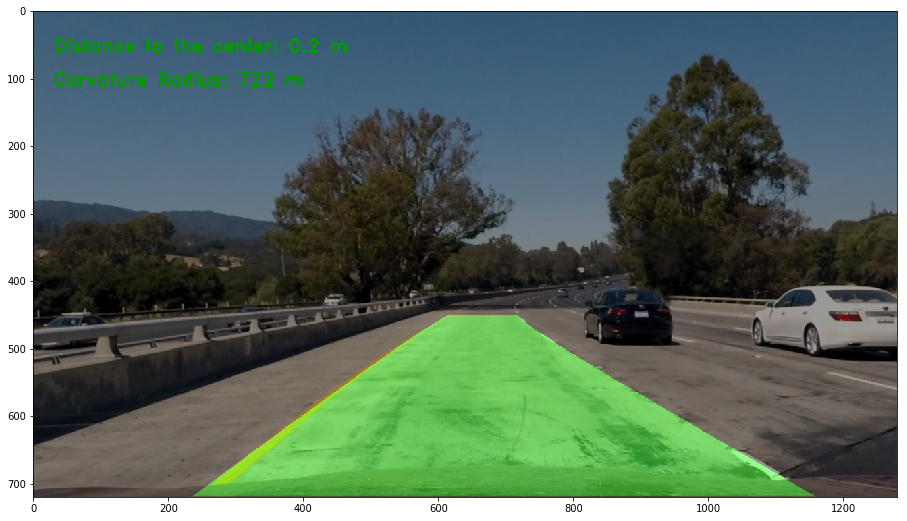

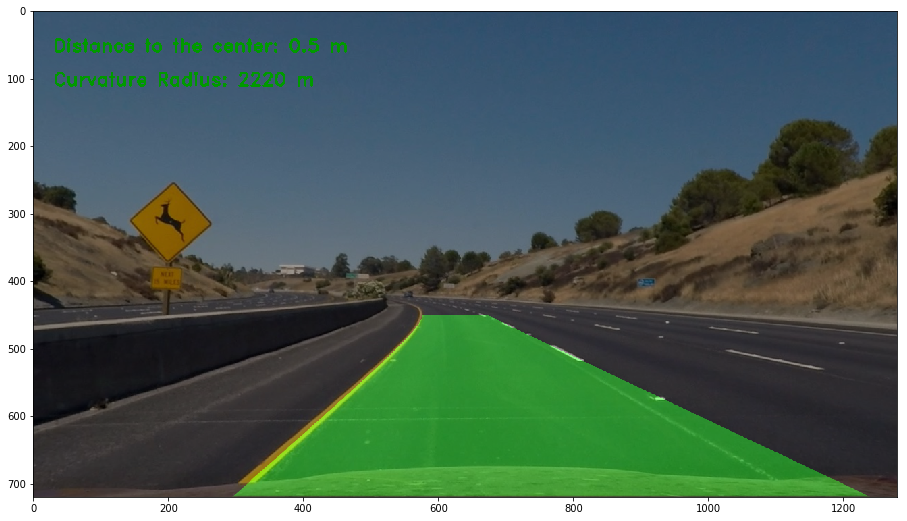

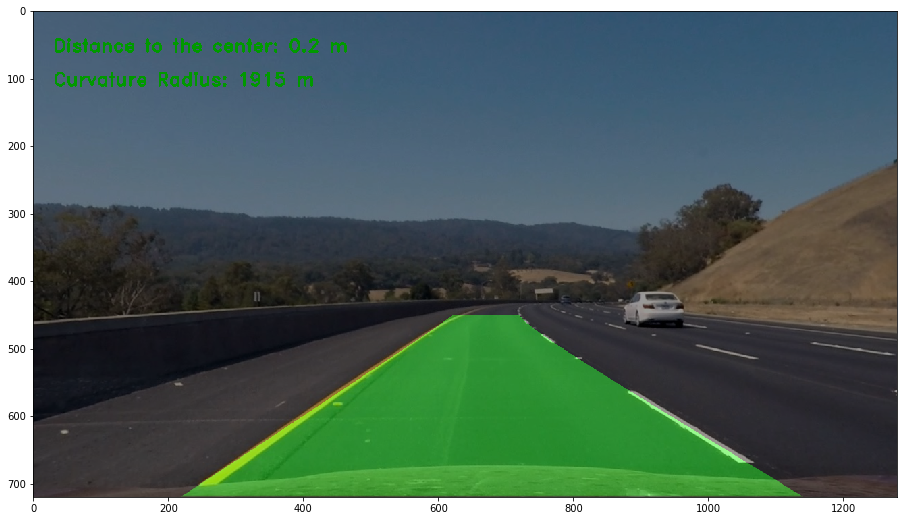

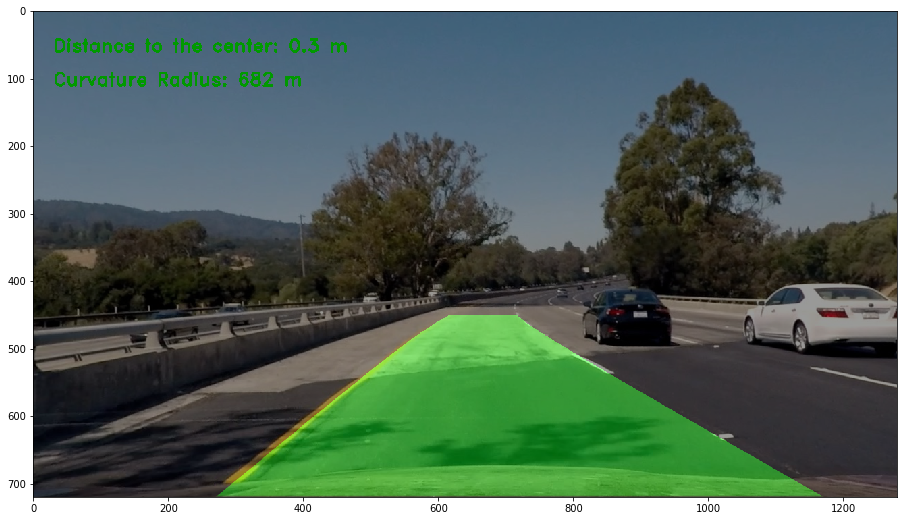

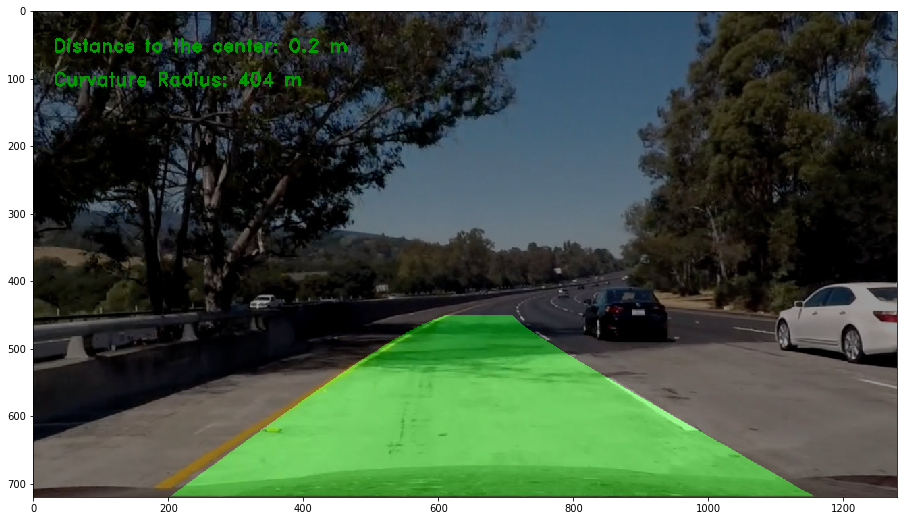

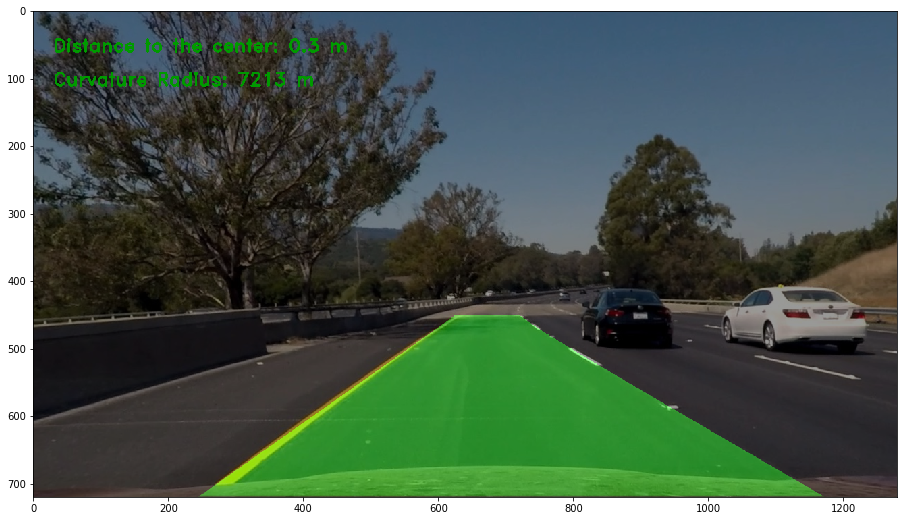

In [11]:
for image_path in glob.glob('test_images/test*.jpg'):
    
    image = mpimg.imread(image_path)
    
    calibrated = undistort(image) 
    
    pipeline = Pipeline(calibrated)
    
    overlay = pipeline.run(calibrated)
    
    mpimg.imsave(image_path.replace('test_images', 'output_images'), overlay)
    
    plt.figure(figsize=(12, 12))
    plt.imshow(overlay)
    plt.subplots_adjust(left=0.0, right=1, top=0.9, bottom=0.0)
    plt.show() 


## Pass the video stream to the Pipeline

In [12]:
from moviepy.editor import VideoFileClip

# Generates a gif from a video
def gif_from_video(video_path_prefix, s=(0,0), f=(0,15)):
    video_file = 'output_videos/{}_output.mp4'.format(video_path_prefix)
    
    clip = (VideoFileClip(video_file).subclip(s,f).resize(0.5))
    %time clip.write_gif('output_videos/{}_output.gif'.format(video_path_prefix), fps=10)

# Outputs the video with the detected lane marking'    
def detect_lane_in_video(video_path_prefix):
    output_video_name = '{}_output.mp4'.format(video_path_prefix)
    input_video = VideoFileClip("{}.mp4".format(video_path_prefix))

    calibrated = undistort(input_video.get_frame(0)) 
    pipeline = Pipeline(calibrated)

    output_video = input_video.fl_image(pipeline.run)

    %time output_video.write_videofile(output_video_name, audio=False)

detect_lane_in_video('challenge_video')
detect_lane_in_video('project_video')

detect_lane_in_video('harder_challenge_video')

gif_from_video('project_video',s=(0, 15), f=(0,40))

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|████████████████████████████████████████| 485/485 [01:33<00:00,  4.84it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

Wall time: 1min 34s
[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████████████████████████████████▉| 1260/1261 [04:14<00:00,  5.07it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 4min 15s
[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


100%|█████████████████████████████████████▉| 1199/1200 [04:14<00:00,  4.81it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

Wall time: 4min 14s

[MoviePy] Building file videos/project_video_output.gif with imageio


100%|███████████████████████████████████████▊| 250/251 [00:17<00:00, 12.31it/s]


Wall time: 18 s
